In [12]:
import os
from os import listdir
from os.path import isfile, join

os.listdir("test_images/")

['whiteCarLaneSwitch.jpg',
 'solidYellowCurve.jpg',
 'T3.JPG',
 'solidWhiteCurve.jpg',
 'solidYellowCurve2.jpg',
 'solidWhiteRight.jpg',
 'solidYellowLeft.jpg',
 'T4.JPG']

In [13]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.pyplot import figure, imshow, axis
from matplotlib.image import imread

import numpy as np
import cv2
from glob import glob
import PIL.Image
from IPython.display import Image, HTML, display
import matplotlib.colors
import colorsys

# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

%matplotlib inline
#im = mpimg.imread('test_images/extraTest1.jpg')
#print(im.shape)

In [14]:
import math
    
def bgr2rgb(inputImg):
    b,g,r = cv2.split(inputImg)       # get b,g,r
    rgb_img = cv2.merge([r,g,b])
    return rgb_img

def rgb2bgr(inputImg):
    r,g,b = cv2.split(inputImg)       # get r,g,b
    bgr_img = cv2.merge([b,g,r])
    return bgr_img



def display_multImages(inputImgs):
    #This function determine sizes and convert from bgr to rgb then display the input array of images
    for img in inputImgs:
        rgb_img = bgr2rgb(img)
        plt.figure()
        plt.show(rgb_img)
    
    
def grayscale(img):
    """Applies the Grayscale transform
    This will return an image with only one color channel
    but NOTE: to see the returned image as grayscale
    (assuming your grayscaled image is called 'gray')
    you should call plt.imshow(gray, cmap='gray')"""
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Or use BGR2GRAY if you read an image with cv2.imread()
    # return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
def canny(img, low_threshold, high_threshold):
    """Applies the Canny transform"""
    return cv2.Canny(img, low_threshold, high_threshold)

def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def draw_lines(img, lines, color=[255, 0, 0], thickness=2):
    """
    NOTE: this is the function you might want to use as a starting point once you want to 
    average/extrapolate the line segments you detect to map out the full
    extent of the lane (going from the result shown in raw-lines-example.mp4
    to that shown in P1_example.mp4).  
    
    Think about things like separating line segments by their 
    slope ((y2-y1)/(x2-x1)) to decide which segments are part of the left
    line vs. the right line.  Then, you can average the position of each of 
    the lines and extrapolate to the top and bottom of the lane.
    
    This function draws `lines` with `color` and `thickness`.    
    Lines are drawn on the image inplace (mutates the image).
    If you want to make the lines semi-transparent, think about combining
    this function with the weighted_img() function below
    """
    for line in lines:
        for x1,y1,x2,y2 in line:
            cv2.line(img, (x1, y1), (x2, y2), color, thickness)
            
            #if (x2-x1) != 0:
            #    slope = np.array([((y2-y1)/(x2-x1))])        
            #    print (slope)
            
                
def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap):
    """
    `img` should be the output of a Canny transform.
        
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    draw_lines(line_img, lines)
    return line_img

def weighted_img(img, initial_img, α=0.8, β=1., λ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + λ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, λ)

def lane_detect(img):
    
    """
    This pipe line is intended to detect lane markers in either a given single image or a stream of images.
    """
    
    im_gray = grayscale(image)
    
    
    im_edges = canny(im_gray, 50, 250)
    
    
    im_blurred = gaussian_blur(im_edges, 7)
    
    left_bottom  = [(0.1042 * img_X), (1 * img_Y)]
    right_bottom = [(0.99 * img_X)  , (1 * img_Y)]
    
    left_top     = [(0.469 * img_X), (0.56 * img_Y)]
    right_top    = [(0.521 * img_X), (0.56 * img_Y)]
    
    vertices = np.array([[left_bottom[0], left_bottom[1]], [right_bottom[0] ,right_bottom[1]], [left_top[0],left_top[1]], [right_top[0],right_top[1]]])
    masked_im = region_of_interest(im_blurred, np.int32([vertices]))
    
    
    rho = 1
    theta = np.pi/180
    threshold = 1
    min_line_len = 10
    max_line_gap = 1
    
    line_img = hough_lines(masked_im, rho, theta, threshold, min_line_len, max_line_gap)
   
    
    
    
    
    return weighted_image


def displayImgs(ImagesArr):
    fig = plt.figure(figsize=(60, 60))  # width, height in inches

    for i in range(len(ImagesArr)):
        sub = fig.add_subplot(4, 2, i + 1)
        sub.imshow(ImagesArr[i], interpolation='nearest')

def rgb2hls(ImagesArr):
    hls = np.zeros_like(ImagesArr)
    #for i in range (len(ImagesArr)):
    hls = cv2.cvtColor(ImagesArr, cv2.COLOR_RGB2HLS)
    return hls

def rgb2hsv(ImagesArr):
    hsv = np.zeros_like(ImagesArr)
    for i in range (len(ImagesArr)):
        hsv[i] = cv2.cvtColor(Test_images[i], cv2.COLOR_RGB2HSV)
    return hsv

def yellowExtract(ImagesArr, lower_yellow, upper_yellow):

    yellowDetect = np.zeros_like(ImagesArr)
    
    #for i in range (len(ImagesArr)): 
    yellowMask = cv2.inRange(ImagesArr, lower_yellow, upper_yellow)
        #yellowDetect[i] = cv2.bitwise_and(ImagesArr[i],ImagesArr[i], mask= yellowMask)
    return yellowMask        

def whiteExtract(ImagesArr, lower_white, upper_white):
    
    whiteDetect = np.zeros_like(ImagesArr)
    
    #for i in range (len(ImagesArr)): 
    whiteMask = cv2.inRange(ImagesArr, lower_white, upper_white)
        #whiteDetect[i] = cv2.bitwise_and(ImagesArr[i],ImagesArr[i], mask= whiteMask)
    return whiteMask   

def ROI(ImagesArr, vertices):
    
    masked_imgs = np.zeros_like(ImagesArr)
    
    #for i in range (len(ImagesArr)):
    masked_imgs = region_of_interest(ImagesArr, np.int32([vertices]))
    return masked_imgs

def EdgeDetect(ImagesArr):

    #edges = np.zeros_like(ImagesArr[:,:])
    #graysImg = np.zeros_like(ImagesArr[:,:])
    #blurredImg = np.zeros_like(ImagesArr[:,:])
    
    #edges = np.zeros_like(ImagesArr)
    #graysImg = np.zeros_like(ImagesArr)
    #blurredImg = np.zeros_like(ImagesArr)
    #print(edges.shape)
    
    #Edges = np.uint8(edges)    
    #GraysImg = np.uint8(graysImg)
    #BlurredImg = np.uint8(blurredImg)
    
    #for i in range (len(ImagesArr)):
    #GraysImg = cv2.cvtColor(ImagesArr, cv2.COLOR_RGB2GRAY)
    Edges = canny(ImagesArr, 50, 250)
    BlurredImg = gaussian_blur(Edges, 7)
    
    return BlurredImg

def LaneDetect(ImagesArr):

    line_img = np.zeros_like(ImagesArr)
    Lines_img = np.uint8(line_img)
    
    #for i in range (len(BlurredImg)):
    Lines_img = hough_lines(ImagesArr , rho, theta, threshold, min_line_len, max_line_gap)

    return Lines_img

def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)
    hls = np.zeros_like(image)
    yellowMask = np.zeros_like(image)
    whiteMask = np.zeros_like(image)
    yellowDetect = np.zeros_like(image)
    whiteDetect = np.zeros_like(image)
    finalColorMask = np.zeros_like(image)
    colorMaskedimg = np.zeros_like(image)
    masked_imgs = np.zeros_like(image)
    blurredImg = np.zeros_like(image)
    Lines_img = np.uint8(image)
    lanes_frame = np.zeros_like(image)
    
    frame_height, frame_width = image.shape[:2]
    
    vertices = np.array([[(0.11*frame_width), frame_height], [frame_width ,frame_height], [(0.50*frame_width),(0.58*frame_height)], [(0.48*frame_width),(0.58*frame_height)]])
   
    hls = rgb2hls(image)
    
    yellowMask = yellowExtract(hls, lower_yellow_hls, upper_yellow_hls)
    
    whiteMask = whiteExtract(hls, lower_white_hls, upper_white_hls)
    
    
    finalColorMask = cv2.bitwise_xor(yellowMask, whiteMask)
    
    colorMaskedimg = cv2.bitwise_and(hls, hls, mask = finalColorMask)
    
    
    masked_imgs = ROI(colorMaskedimg, vertices)
    
    blurredImg = EdgeDetect(masked_imgs)
    
    Lines_img = LaneDetect(blurredImg)
    lanes_frame = weighted_img(Lines_img, image, α=0.8, β=1., λ=0.)
    return lanes_frame

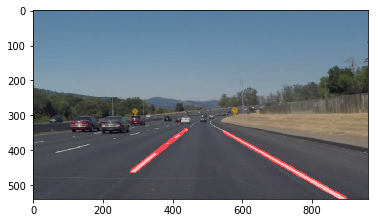

In [15]:
lower_yellow_hls = np.array([10 , 0 ,100], dtype=np.uint8)
upper_yellow_hls = np.array([40, 255 , 255], dtype=np.uint8)

lower_white_hls = np.array([0,220,0], dtype=np.uint8)
upper_white_hls = np.array([255,255,255], dtype=np.uint8)

rho = 1
theta = np.pi/180
threshold = 50 #1
min_line_len = 120 #10
max_line_gap = 160 #1

img = mpimg.imread('test_images/solidWhiteCurve.jpg')
img = process_image(img)
plt.imshow(img)


In [10]:
lower_yellow_hls = np.array([10 , 0 ,100], dtype=np.uint8)
upper_yellow_hls = np.array([40, 255 , 255], dtype=np.uint8)

lower_white_hls = np.array([0,220,0], dtype=np.uint8)
upper_white_hls = np.array([255,255,255], dtype=np.uint8)

rho = 1
theta = np.pi/180
threshold = 50 #1
min_line_len = 120 #10
max_line_gap = 160 #1

white_output = 'test_videos_output/challenge.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
#clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
#clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4")
#clip1 = VideoFileClip("test_videos/solidYellowLeft.mp4").subclip(0,5)
#clip1 = VideoFileClip("test_videos/solidYellowLeft.mp4")
clip1 = VideoFileClip("test_videos/challenge.mp4").subclip(0,5)
clip1 = VideoFileClip("test_videos/challenge.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)
#clip1.reader.close()
#clip1.audio.reader.close_proc()


[MoviePy] >>>> Building video test_videos_output/challenge.mp4
[MoviePy] Writing video test_videos_output/challenge.mp4


100%|██████████| 251/251 [00:17<00:00, 14.61it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/challenge.mp4 

CPU times: user 29.9 s, sys: 1.8 s, total: 31.7 s
Wall time: 19.3 s


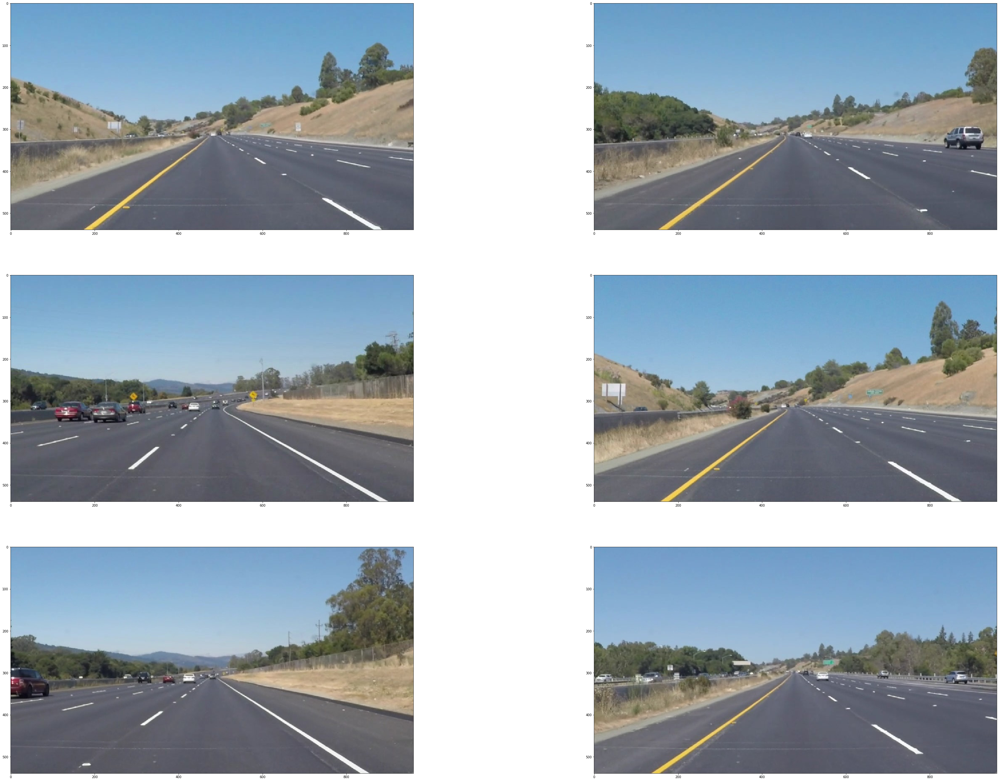

In [25]:
filelist = glob('test_images/*.jpg')
Test_images = np.array([np.array(PIL.Image.open(fname)) for fname in filelist])
displayImgs(Test_images)

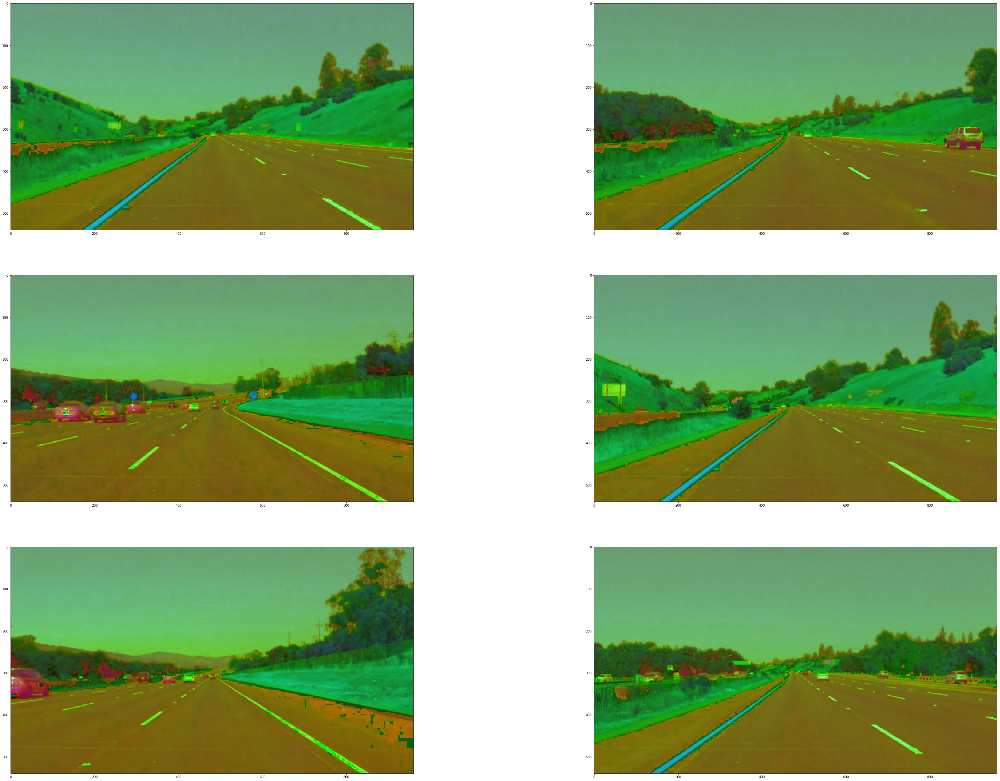

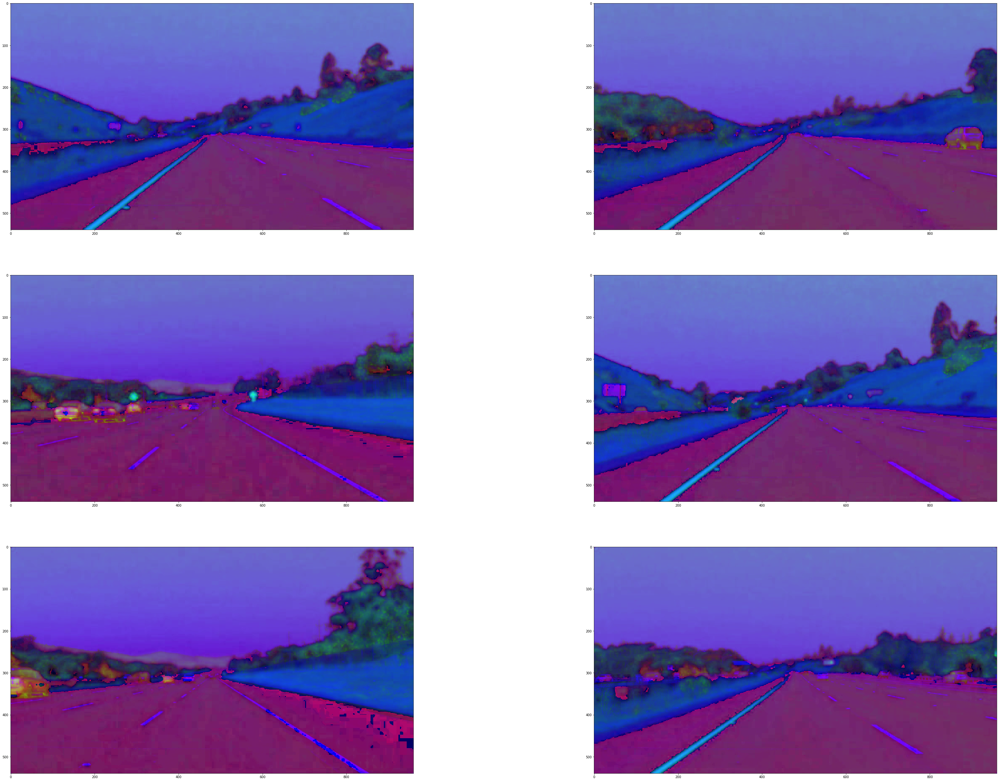

In [17]:
hls = np.zeros_like(Test_images)
hsv = np.zeros_like(Test_images)
gray = np.zeros_like(Test_images)

#hsv = matplotlib.colors.rgb_to_hsv(Test_images)
#hls = matplotlib.colors.rgb_to_hls(Test_images)

for i in range (len(Test_images)):
    hsv[i] = cv2.cvtColor(Test_images[i], cv2.COLOR_RGB2HSV)
    hls[i] = cv2.cvtColor(Test_images[i], cv2.COLOR_RGB2HLS)
    #gray[i] = cv2.cvtColor(Test_images[i], cv2.COLOR_RGB2GRAY)
    #print(hls[i].shape)
    
displayImgs(hls)
displayImgs(hsv)
#displayImgs(gray)


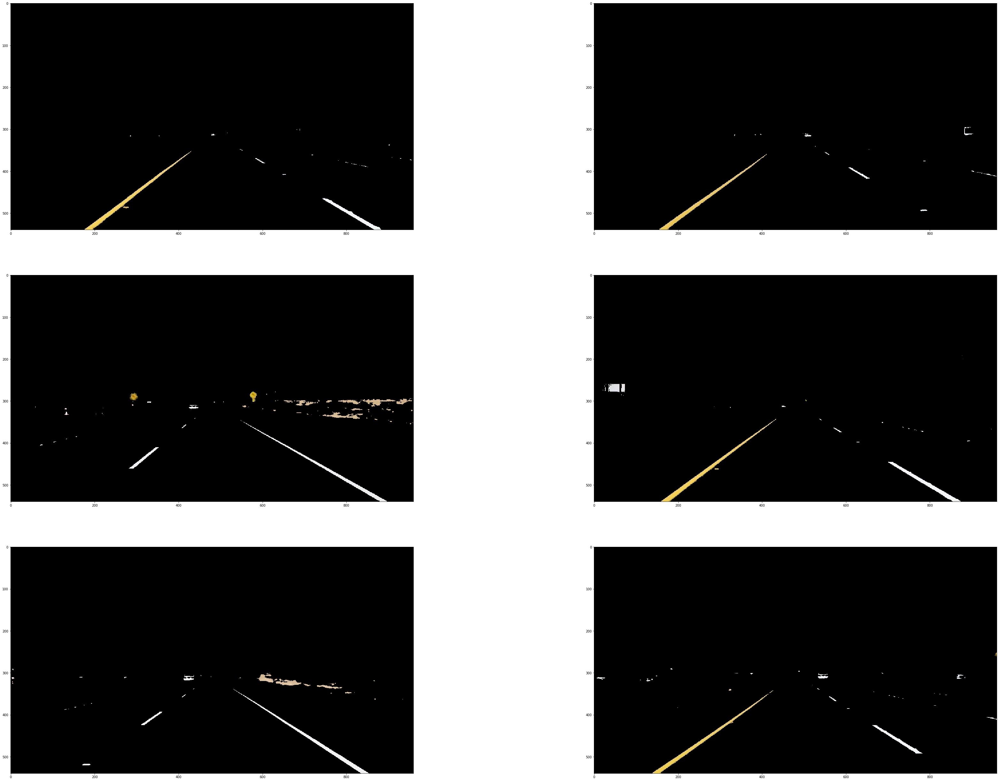

In [20]:
#yellow_mask = np.zeros_like(hls)
#print(len(hls))
#print(yellow_mask.shape)
#white_mask = np.zeros_like([6,540,960])
res_hls = np.zeros_like(Test_images)
res = np.zeros_like(Test_images)
#final_colormask = np.zeros_like(yellow_mask)

# define range of yellow & white colors in HLS
lower_yellow = np.array([190, 190, 0], dtype=np.uint8)
upper_yellow = np.array([255,255,160], dtype=np.uint8)

lower_white = np.array([200, 200, 200], dtype=np.uint8)
upper_white = np.array([255,255,255], dtype=np.uint8)


#lower_yellow_hls = np.array([20, 100, 100], dtype=np.uint8)
#upper_yellow_hls = np.array([30, 255, 255], dtype=np.uint8)

lower_yellow_hls = np.array([10 , 0 ,100], dtype=np.uint8)
upper_yellow_hls = np.array([40, 255 , 255], dtype=np.uint8)

lower_white_hls = np.array([0,220,0], dtype=np.uint8)
upper_white_hls = np.array([255,255,255], dtype=np.uint8)
# Threshold the HLS image to get only yellow and white colors

# Bitwise-AND mask and original image
#
for i in range (len(Test_images)): 
    yellow_mask = cv2.inRange(Test_images[i], lower_yellow, upper_yellow)
    white_mask  =  cv2.inRange(Test_images[i], lower_white, upper_white)
    final_colormask = cv2.bitwise_or(yellow_mask, white_mask)
    
    yellow_mask_hls = cv2.inRange(hls[i], lower_yellow_hls, upper_yellow_hls)
    white_mask_hls  =  cv2.inRange(hls[i], lower_white_hls, upper_white_hls)
    final_colormask_hls = cv2.bitwise_or(yellow_mask_hls, white_mask_hls)
    #final_colormask = white_mask
    res[i] = cv2.bitwise_and(Test_images[i],Test_images[i], mask= final_colormask)
    res_hls[i] = cv2.bitwise_and(Test_images[i],Test_images[i], mask= final_colormask_hls)
#for i in range (len(Test_images)): 
#    res[i] = cv2.bitwise_and(Test_images[i],Test_images[i], mask= final_colormask)

#displayImgs(res)
displayImgs(res_hls)
#print(yellow_mask.shape)

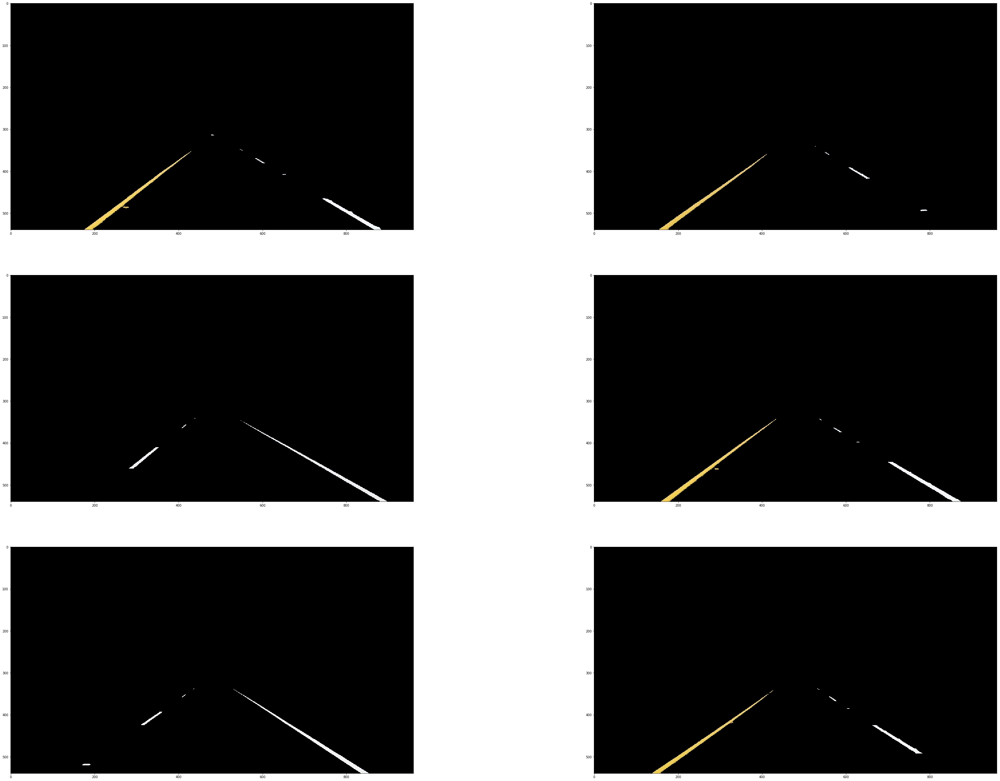

In [21]:
im = Test_images[1]
masked_imgs = np.zeros_like(Test_images)
masked_imgs_hls = np.zeros_like(Test_images)

frame_height, frame_width = im.shape[:2]
vertices = np.array([[(0.11*frame_width), frame_height], [frame_width ,frame_height], [(0.50*frame_width),(0.58*frame_height)], [(0.48*frame_width),(0.58*frame_height)]])

for i in range (len(hls)):
    masked_imgs[i] = region_of_interest(res[i], np.int32([vertices]))
    masked_imgs_hls[i] = region_of_interest(res_hls[i], np.int32([vertices]))
    
#displayImgs(masked_imgs)
displayImgs(masked_imgs_hls)

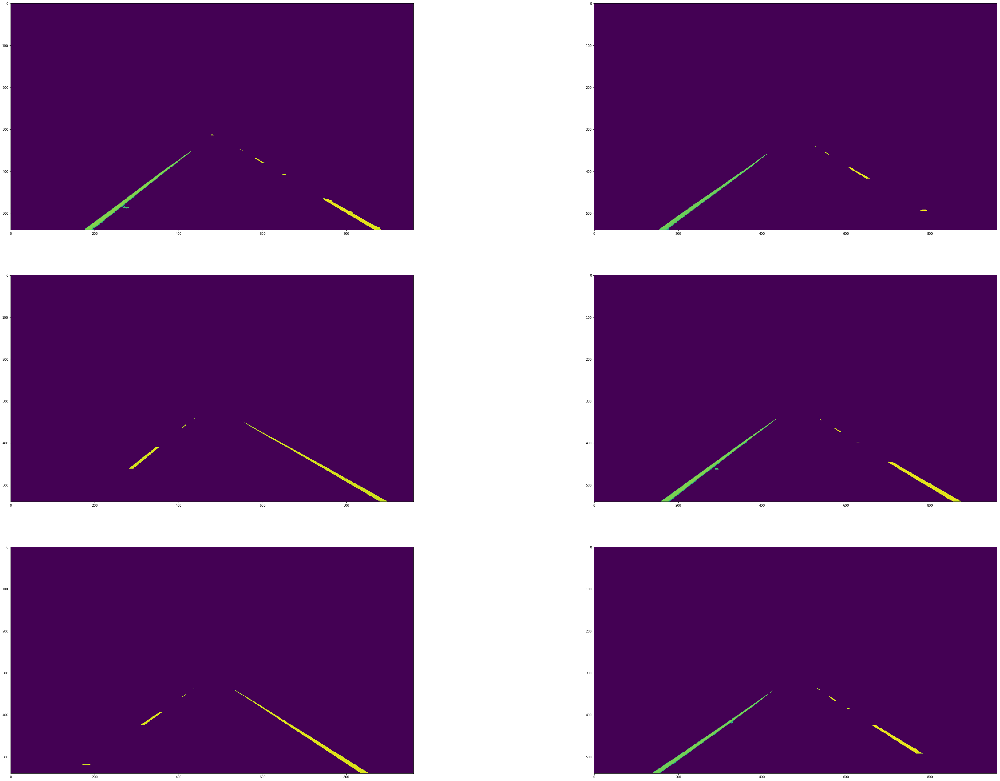

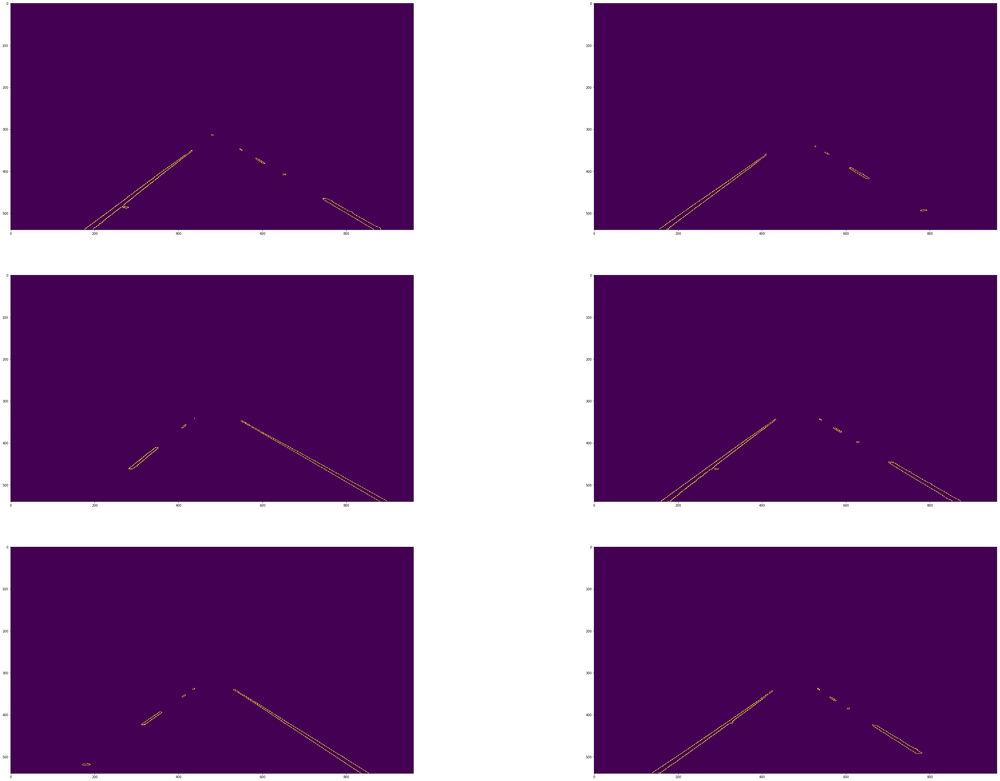

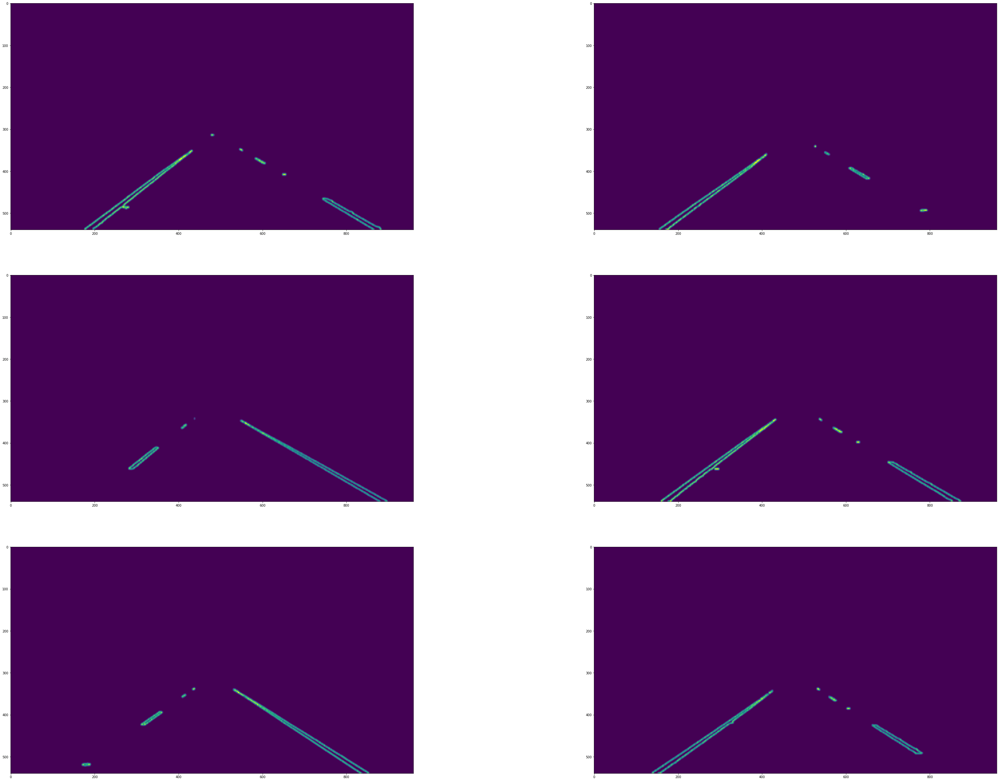

In [26]:
edges = np.zeros((6,540,960))
graysImg = np.zeros((6,540,960))
blurredImg = np.zeros((6,540,960))

Edges = np.uint8(edges)    
GraysImg = np.uint8(graysImg)
BlurredImg = np.uint8(blurredImg)

for i in range (len(masked_imgs_hls)):
    GraysImg[i] = grayscale(masked_imgs_hls[i])
    Edges[i] = canny(GraysImg[i], 50, 250)
    BlurredImg[i] = gaussian_blur(Edges[i], 7)
    
displayImgs(GraysImg)
displayImgs(Edges)
displayImgs(BlurredImg)

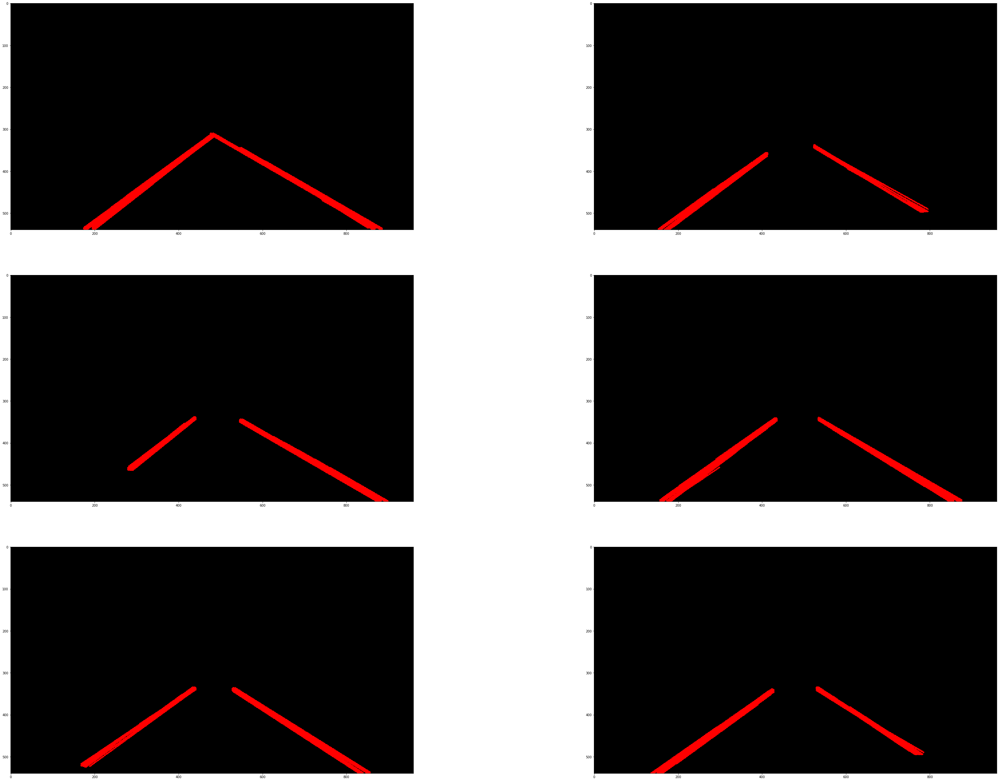

In [27]:
rho = 1
theta = np.pi/180
threshold = 50 #1
min_line_len = 120 #10
max_line_gap = 160 #1
line_img = np.zeros_like(Test_images)
Lines_img = np.uint8(line_img)

for i in range (len(BlurredImg)):
    Lines_img[i] = hough_lines(BlurredImg[i] , rho, theta, threshold, min_line_len, max_line_gap)

displayImgs(Lines_img)

In [28]:
weighted_image = lane_detect(Lines_img)


NameError: name 'image' is not defined

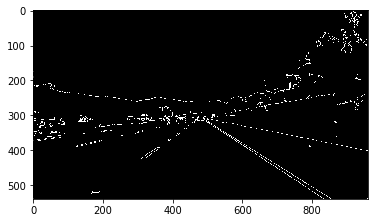

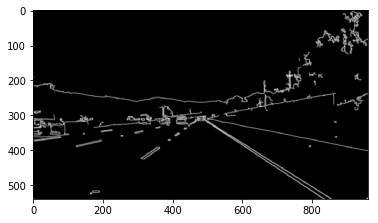

In [162]:
im_blurred = gaussian_blur(im_edges, 7)
plt.imshow(im_blurred, cmap='gray')

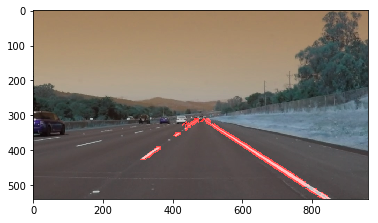

In [101]:
weighted_img = weighted_img(line_img, image, α=0.8, β=1., λ=0.)
plt.imshow(weighted_img, cmap='gray')

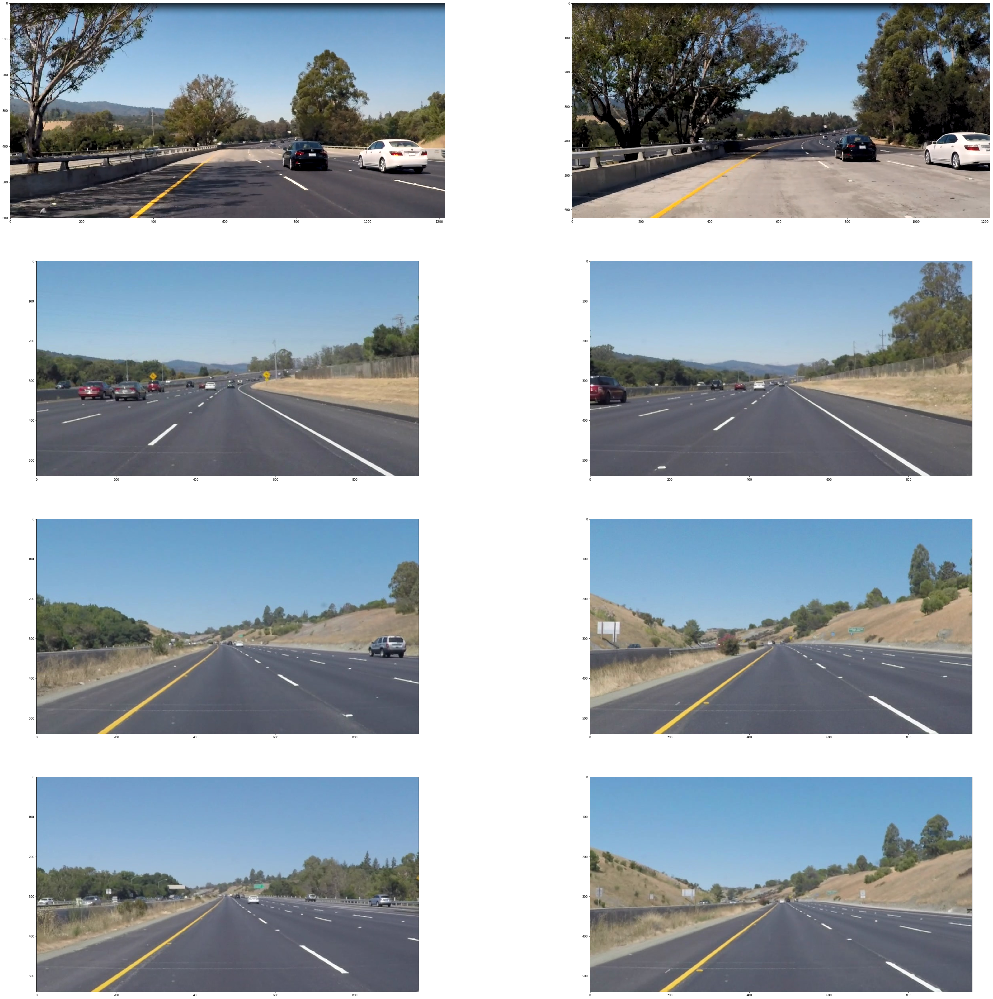

In [11]:
#input_imgs = []

#files = glob.glob ("test_images/*.jpg")

#images = [cv2.imread(file) for file in glob.glob("test_images/")]
#for myFile in files:
#    img = cv2.imread (myFile)
#    rgb_img = bgr2rgb(img)
#    rgb_img.dtype = np.uint8
#    input_imgs.append (input_imgs.append (rgb_img))
#    
#for input_img in input_imgs: 
#    bgr2rgb(input_img)
#img = np.array[([cv2.imread ("solidWhiteCurve.jpg")], [cv2.imread ("whiteCarLaneSwitch.jpg")])]   

#mypath='test_images/'
#onlyfiles = [ f for f in listdir(mypath) if isfile(join(mypath,f)) ]
#images = np.empty(len(onlyfiles), dtype=object)
#for n in range(0, len(onlyfiles)):
#  images[n] = cv2.imread( join(mypath,onlyfiles[n]) )

#showImagesHorizontally(files)

#---------------------------------------------------------------------

#imagesList=''.join( ["<img style='width: 300px; margin: 0px; float: left; border: 1px solid black;' src='%s' />" % str(s) 
#                     for s in sorted(filelist)])
#display(HTML(imagesList))
#for i in range(len(images)):
#    plt.imshow(images[i,], interpolation='nearest')

In [23]:
#yellow_mask = np.zeros_like(image)

#yellow_min_thresh = np.array([0, 162, 186], dtype = "uint8") 
#yellow_max_thresh = np.array([46, 242, 255], dtype = "uint8")
#
#yellow_mask = cv2.inRange(image, yellow_min_thresh, yellow_max_thresh )
#img_yellow = cv2.bitwise_and(image, image, mask = yellow_mask)
#plt.imshow(img_yellow)

#HSV color space conversion

#r,g,b = cv2.split(image)

#for image in range(len(Test_images)):
    hsl = matplotlib.colors.rgb_to_hsv(Test_images)
    #hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

# define range of blue color in HSV
lower_blue = np.array([20, 100, 100])
upper_blue = np.array([45,255,200])
# Threshold the HSV image to get only blue colors
mask = cv2.inRange(hsl, lower_blue, upper_blue)
# Bitwise-AND mask and original image
res = cv2.bitwise_and(image,image, mask= mask)

plt.imshow(res)


TypeError: 'builtin_function_or_method' object is not subscriptable